In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

train = pd.read_csv('train.csv')
train.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,...,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,...,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,...,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,...,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,...,0,0,0,0,0,0,0,0,0,5


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15120 entries, 0 to 15119
Data columns (total 56 columns):
 #   Column                              Non-Null Count  Dtype
---  ------                              --------------  -----
 0   Id                                  15120 non-null  int64
 1   Elevation                           15120 non-null  int64
 2   Aspect                              15120 non-null  int64
 3   Slope                               15120 non-null  int64
 4   Horizontal_Distance_To_Hydrology    15120 non-null  int64
 5   Vertical_Distance_To_Hydrology      15120 non-null  int64
 6   Horizontal_Distance_To_Roadways     15120 non-null  int64
 7   Hillshade_9am                       15120 non-null  int64
 8   Hillshade_Noon                      15120 non-null  int64
 9   Hillshade_3pm                       15120 non-null  int64
 10  Horizontal_Distance_To_Fire_Points  15120 non-null  int64
 11  Wilderness_Area1                    15120 non-null  int64
 12  Wild

In [ ]:
!pip install pandas-profiling[notebook,html]

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
profile = ProfileReport(train, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/68 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
train_numerical = train.drop(columns = ["Wilderness_Area1","Wilderness_Area2","Wilderness_Area3", "Wilderness_Area4", "Soil_Type1","Soil_Type2", "Soil_Type3", "Soil_Type4","Soil_Type5","Soil_Type6","Soil_Type7","Soil_Type8", "Soil_Type9","Soil_Type10","Soil_Type11","Soil_Type12","Soil_Type13","Soil_Type14","Soil_Type15","Soil_Type16","Soil_Type17", "Soil_Type18","Soil_Type19","Soil_Type20","Soil_Type21","Soil_Type22","Soil_Type23","Soil_Type24","Soil_Type25","Soil_Type26","Soil_Type27","Soil_Type28","Soil_Type29","Soil_Type30","Soil_Type31","Soil_Type32","Soil_Type33","Soil_Type34","Soil_Type35","Soil_Type36","Soil_Type37","Soil_Type38", "Soil_Type39","Soil_Type40"])
train_numerical 

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,6279,5
1,2,2590,56,2,212,-6,390,220,235,151,6225,5
2,3,2804,139,9,268,65,3180,234,238,135,6121,2
3,4,2785,155,18,242,118,3090,238,238,122,6211,2
4,5,2595,45,2,153,-1,391,220,234,150,6172,5
...,...,...,...,...,...,...,...,...,...,...,...,...
15115,15116,2607,243,23,258,7,660,170,251,214,1282,3
15116,15117,2603,121,19,633,195,618,249,221,91,1325,3
15117,15118,2492,134,25,365,117,335,250,220,83,1187,3
15118,15119,2487,167,28,218,101,242,229,237,119,932,3


In [ ]:
train_categorical = train.drop(columns = ["Id","Elevation", "Aspect", "Slope", "Horizontal_Distance_To_Hydrology", "Vertical_Distance_To_Hydrology", "Horizontal_Distance_To_Roadways", "Hillshade_9am", "Hillshade_Noon", "Hillshade_3pm", "Horizontal_Distance_To_Fire_Points"])
train_categorical

,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,3
15116,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,3
15117,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,3
15118,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,3


In [ ]:
import seaborn as sns


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


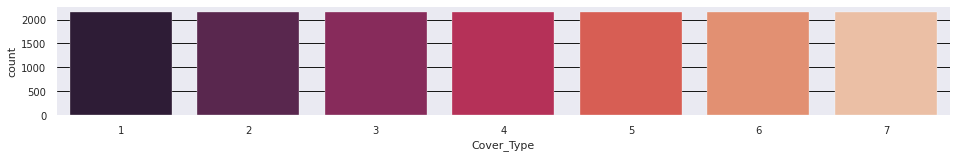

In [ ]:
sns.countplot(train['Cover_Type'] , palette = 'rocket')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

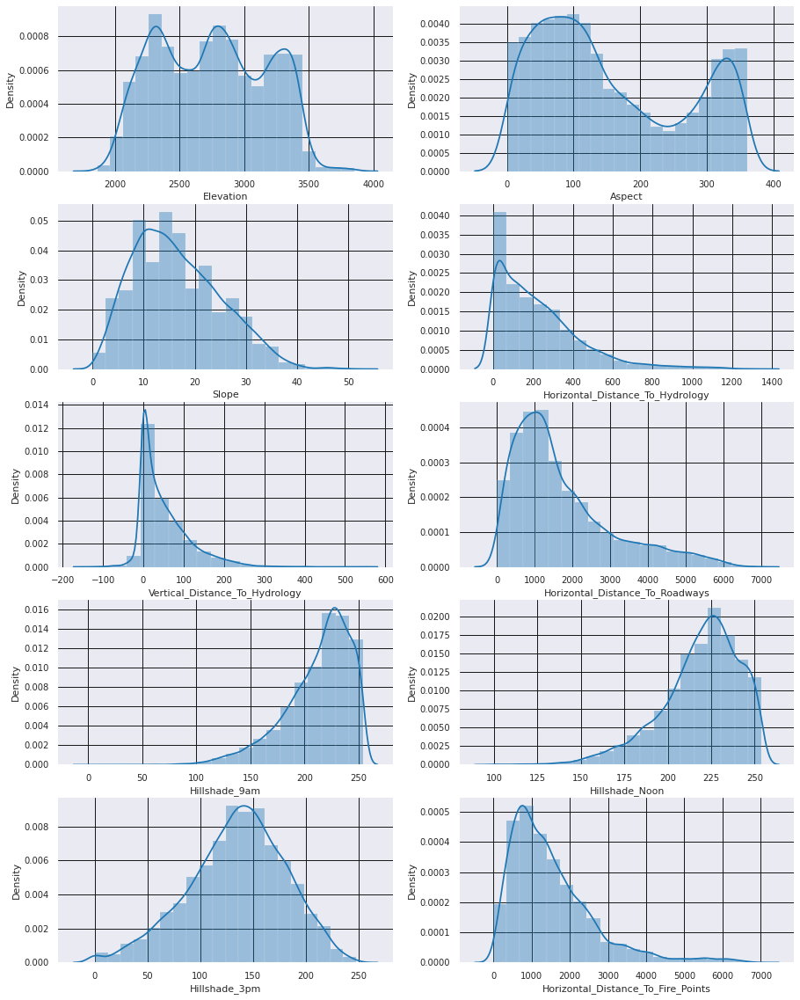

In [ ]:
fig, ax = plt.subplots(5,2, figsize=(15,20))

sns.distplot(train.Elevation, bins=20, ax=ax[0,0])
sns.distplot(train.Aspect, bins=20, ax=ax[0,1])
sns.distplot(train.Slope, bins = 20, ax=ax[1,0]) 
sns.distplot(train.Horizontal_Distance_To_Hydrology, bins = 20, ax=ax[1,1])
sns.distplot(train.Vertical_Distance_To_Hydrology, bins = 20, ax=ax[2,0]) 
sns.distplot(train.Horizontal_Distance_To_Roadways, bins = 20, ax=ax[2,1]) 
sns.distplot(train.Hillshade_9am, bins = 20, ax=ax[3,0]) 
sns.distplot(train.Hillshade_Noon, bins = 20, ax=ax[3,1])
sns.distplot(train.Hillshade_3pm, bins = 20, ax=ax[4,0])
sns.distplot(train.Horizontal_Distance_To_Fire_Points, bins = 20, ax=ax[4,1])
plt.show()

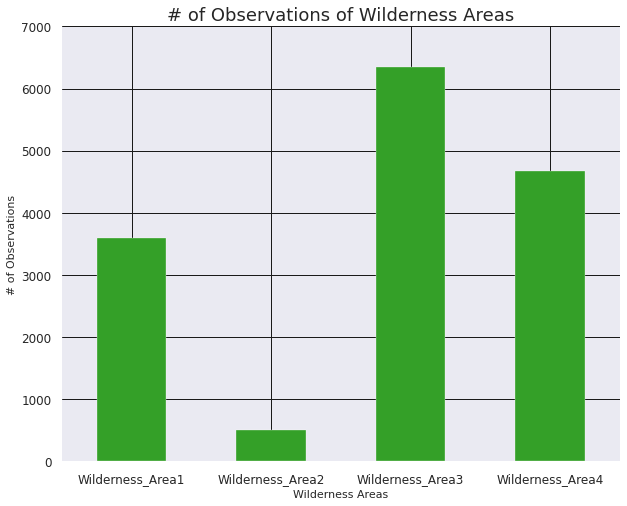

In [ ]:
# split cat_features
wild_data, soil_data = train_categorical.iloc[:,:4], train_categorical.iloc[:,4:]

# plot bg
sns.set_style("darkgrid", {'grid.color':'.1'})
flatui = ["#e74c3c", "#34495e", "#2ecc71","#3498db"]

# use seaborn, pass colors to palette
palette = sns.color_palette(flatui)

# sum the data, plot bar
wild_data.sum().plot(kind='bar', figsize=(10,8), color='#34a028')
plt.title('# of Observations of Wilderness Areas', size=18)
plt.xlabel('Wilderness Areas')
plt.ylabel('# of Observations')
plt.ylim([0,7000])
plt.xticks(rotation='horizontal', size=12)
plt.yticks(size=12)

sns.despine()
plt.show()


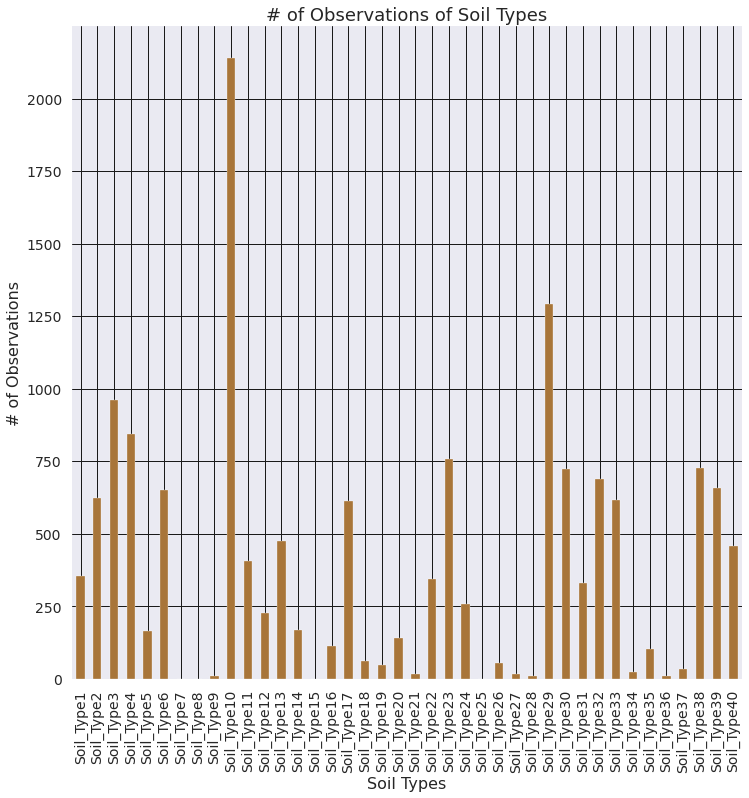

In [ ]:
# plot bg
sns.set_style("darkgrid", {'grid.color': '.1'})

# sum data, plot bar
soil_data.iloc[:,:40].sum().plot(kind='bar', figsize=(12,12), color='#a87539')
plt.title('# of Observations of Soil Types', size=18)
plt.xlabel('Soil Types', size=16)
plt.ylabel('# of Observations', size=16)
plt.xticks(rotation=90, size=14)
plt.yticks(size=14)

sns.despine()
plt.show()


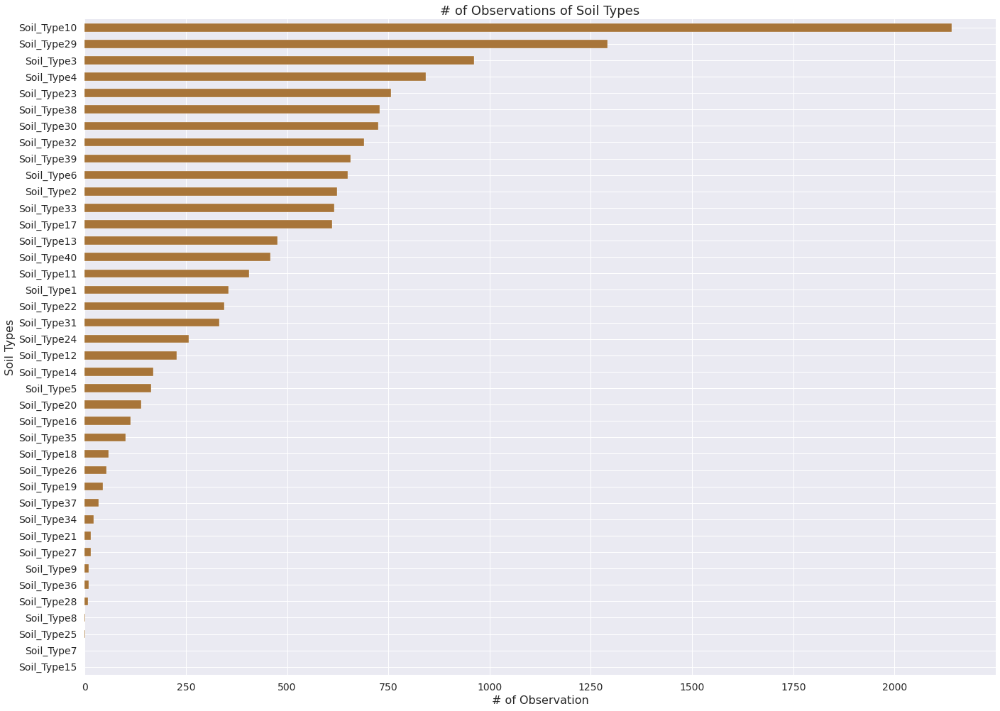

In [ ]:
# plot bg
sns.set_style("darkgrid", {'grid_color': '.1'})

# sum soil data, pass it as a series
soil_sum = pd.Series(soil_data.iloc[:,:40].sum())
soil_sum.sort_values(ascending=False, inplace=True)

# plot bar
soil_sum.plot(kind='barh', figsize=(23,17), color='#a87539')
plt.gca().invert_yaxis()
plt.title('# of Observations of Soil Types', size=18)
plt.xlabel('# of Observation', size=16)
plt.ylabel('Soil Types', size=16)
plt.xticks(rotation='horizontal',size=14)
plt.yticks(size=14)

sns.despine()
plt.show()


ValueError: ignored

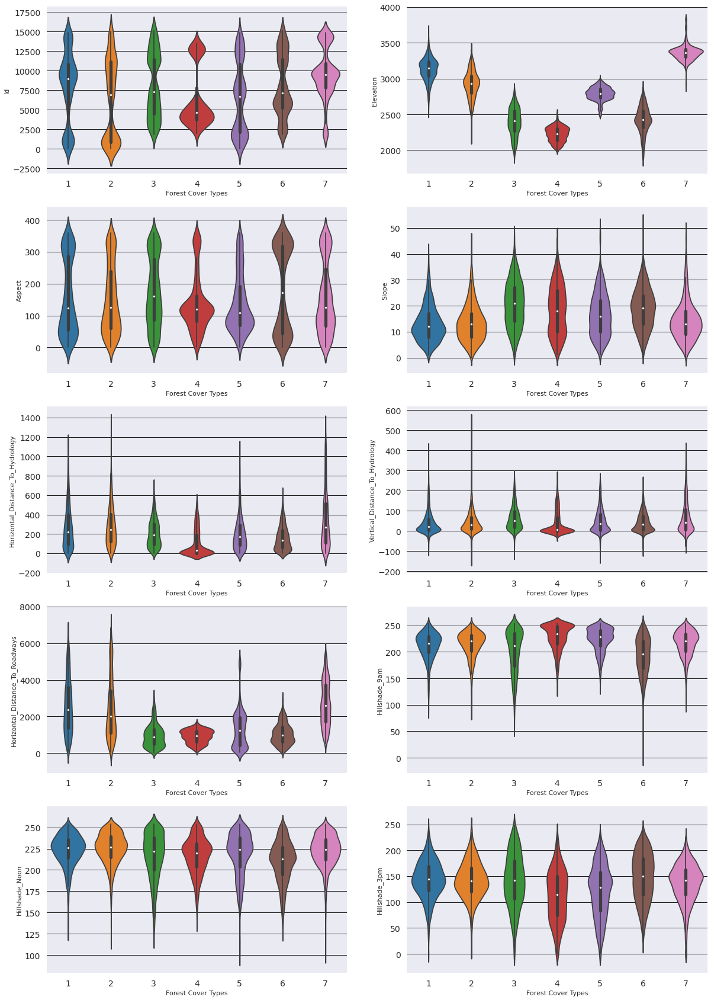

In [ ]:
# plot bg
sns.set_style("darkgrid", {'grid.color': '.1'})

# set target variable
target = train['Cover_Type']

# features to be compared with target variable
features = train_numerical.columns

plt.figure(figsize = [20,30])

# loop for violin plot
for i in range(0, len(features)):
    plt.subplot(5,2,i+1)
    sns.violinplot(data=train_numerical, x=target, y=features[i])
    plt.xticks(size=14)
    plt.yticks(size=14)
    plt.xlabel('Forest Cover Types')
    plt.ylabel(features[i])

plt.show()


In [ ]:
cols = train.columns
r,c = train.shape

# Create a new dataframe with r rows, one column for each encoded category[Wilderness_Area(1-4),Soil_type[1-40], and target in the end
new_train = pd.DataFrame(index= np.arange(0,r), columns=['Wilderness_Area', 'Soil_Type', 'Cover_Type'])
new_train

,Wilderness_Area,Soil_Type,Cover_Type
0,NaN,NaN,NaN
1,NaN,NaN,NaN
2,NaN,NaN,NaN
3,NaN,NaN,NaN
4,NaN,NaN,NaN
...,...,...,...
15115,NaN,NaN,NaN
15116,NaN,NaN,NaN
15117,NaN,NaN,NaN
15118,NaN,NaN,NaN


In [ ]:
#make an entry in data for each r for category_id, target_value
for i in range(0,r):
    p = 0;
    q = 0;
    # wilderness_area range
    for j in range(11,15):
        if (train.iloc[i,j] == 1):
            p = j-10
            break
    # soil_type range
    for k in range(15,55):
        if (train.iloc[i,k] == 1):
            q = k-14
            break
    # make entry in data for each r
    new_train.iloc[i] = [p,q,train.iloc[i, c-1]]

In [ ]:
new_train

,Wilderness_Area,Soil_Type,Cover_Type
0,1,29,5
1,1,29,5
2,1,12,2
3,1,30,2
4,1,29,5
...,...,...,...
15115,3,4,3
15116,3,4,3
15117,3,4,3
15118,3,4,3


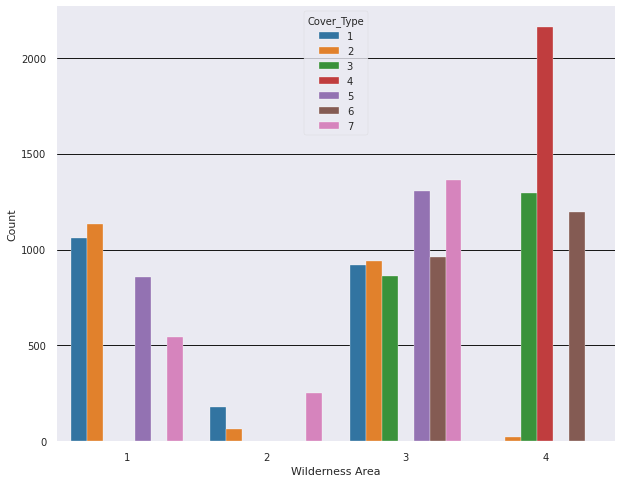

In [ ]:
# plot wilderness_area by cover_type
plt.figure(figsize = [10,8])
sns.countplot(x='Wilderness_Area', hue='Cover_Type', data=new_train)
plt.xlabel('Wilderness Area')
plt.ylabel('Count')
plt.show()

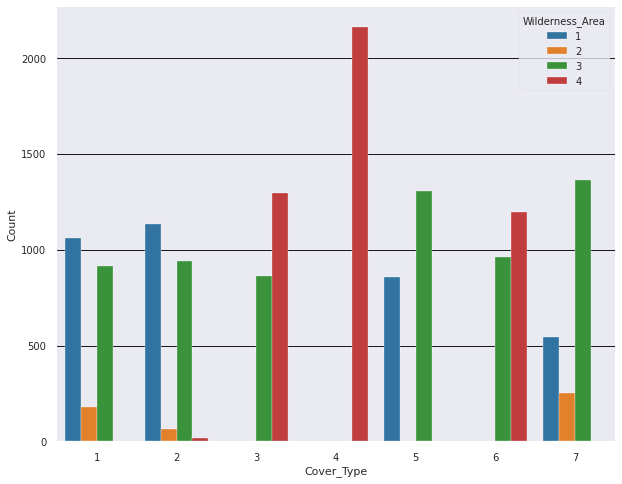

In [ ]:
# plot cover_type by wilderness_area
plt.figure(figsize = [10,8])
sns.countplot(x='Cover_Type', hue='Wilderness_Area', data=new_train)
plt.xlabel('Cover_Type')
plt.ylabel('Count')
plt.show()


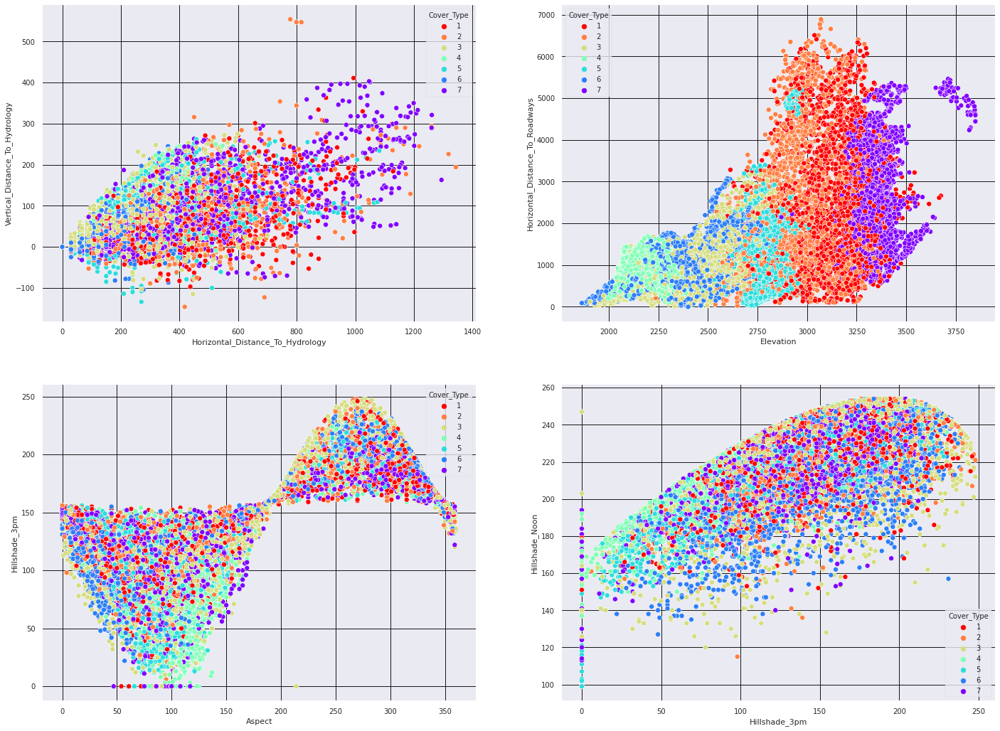

In [ ]:
fig, ax = plt.subplots(2,2, figsize=(24,18))

sns.scatterplot(data=train, x="Horizontal_Distance_To_Hydrology", y="Vertical_Distance_To_Hydrology", hue="Cover_Type", legend='full', palette='rainbow_r', ax=ax[0,0])
sns.scatterplot(data=train, x="Elevation", y="Horizontal_Distance_To_Roadways", hue="Cover_Type", legend='full', palette='rainbow_r', ax=ax[0,1])
sns.scatterplot(data=train, x="Aspect", y="Hillshade_3pm", hue="Cover_Type", legend='full', palette='rainbow_r', ax=ax[1,0])
sns.scatterplot(data=train, x="Hillshade_3pm", y="Hillshade_Noon", hue="Cover_Type", legend='full', palette='rainbow_r', ax=ax[1,1])
plt.show()


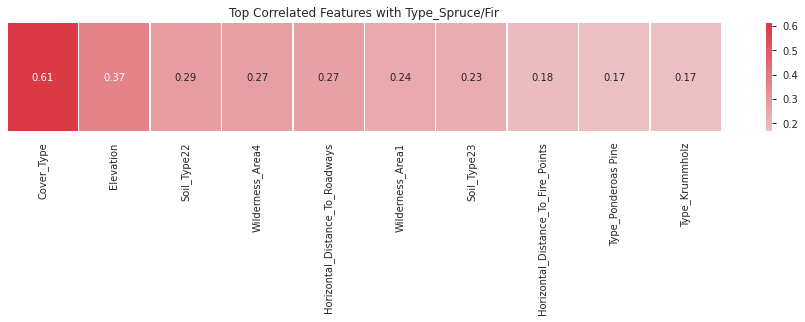

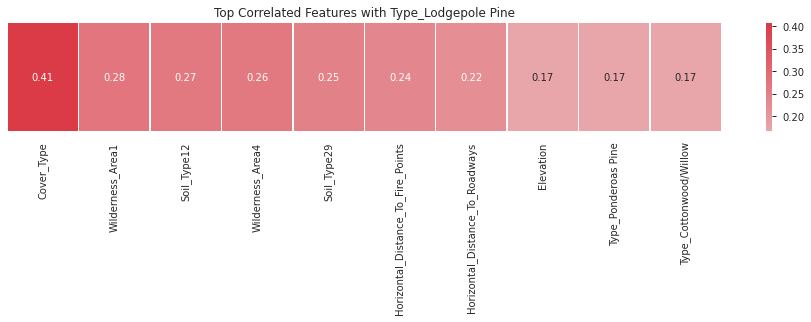

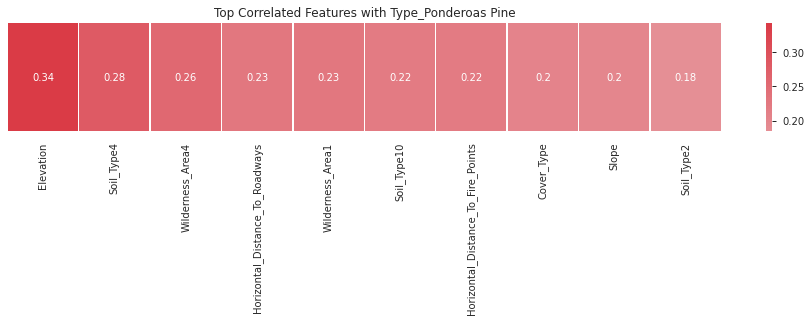

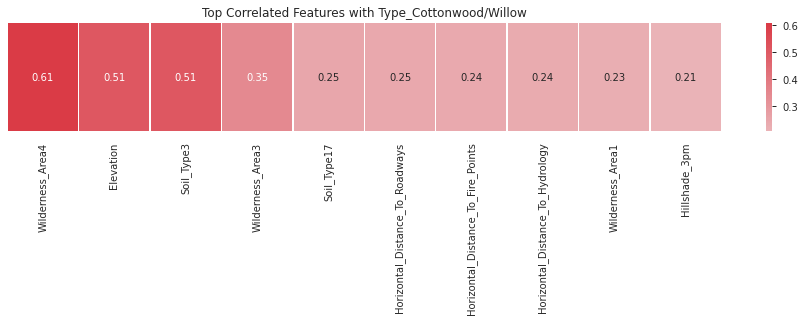

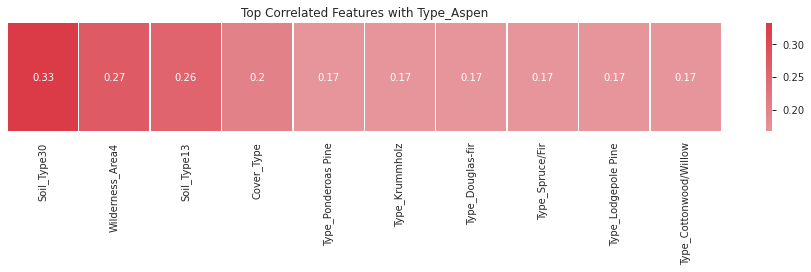

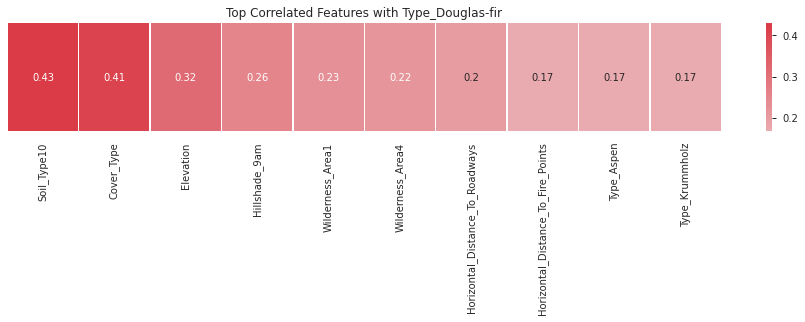

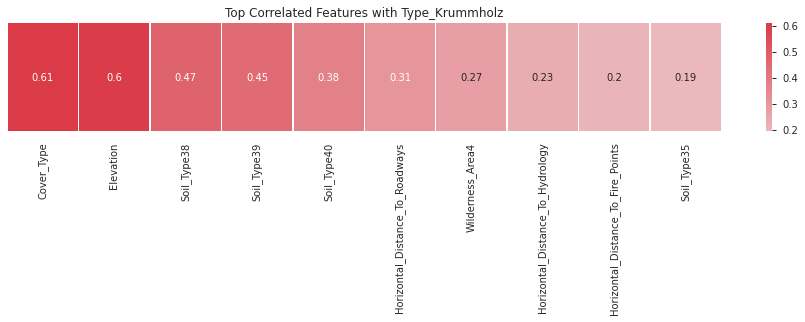

In [ ]:
# create dictionary for cover_type
class_dict = {
    1:'Spruce/Fir',
    2:'Lodgepole Pine',
    3:'Ponderoas Pine',
    4:'Cottonwood/Willow',
    5:'Aspen',
    6:'Douglas-fir',
    7:'Krummholz'
}

# map the integers to their names
train['Cover_Type_Name'] = train['Cover_Type'].map(class_dict)

# one-hot encoding
train_updated = pd.concat([train, pd.get_dummies(train['Cover_Type_Name'], prefix='Type')], axis=1)

all_corr = train_updated.corr()

# plot the top correlated features by cover_type

plt.rcParams['figure.figsize'] = [16,2]

for cov in class_dict.values():
    
    cov_str = 'Type_' + cov
    type_corr = all_corr[[cov_str]].apply(abs).sort_values(by=cov_str, ascending=False)
    
    sns.heatmap(type_corr.iloc[1:11,:].transpose(),
                annot = True,
                cmap = sns.diverging_palette(220, 10, as_cmap=True),
                center = 0,
                linewidth = 0.5)
    plt.yticks([])
    plt.title('Top Correlated Features with {}'.format(cov_str)),
    plt.show()

In [ ]:
location_vars = ['Elevation','Aspect','Slope','Horizontal_Distance_To_Hydrology',
                 'Vertical_Distance_To_Hydrology','Horizontal_Distance_To_Roadways',
                 'Horizontal_Distance_To_Fire_Points']

In [ ]:
def fashion_scatter(x, labels):
    # choose a color palette with seaborn
    num_classes = len(np.unique(labels.values))
    palette = np.array(sns.color_palette("hls", num_classes))
    
    # create a scatter plot
    f = plt.figure(figsize=(8,8))
    ax = plt.subplot(aspect='equal')
    
    for i in range(num_classes):
        index = labels.loc[labels == i + 1].index
        sc = ax.scatter(x[index,0], x[index,1], lw=0, s=30, c=palette[i], label=class_dict[i+1])
    plt.xlim(-25,25)
    plt.ylim(-25,25)
    plt.legend(loc='best')
    ax.axis('tight')
    ax

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

Total explained variance ratio (based on 2 components) = 0.95


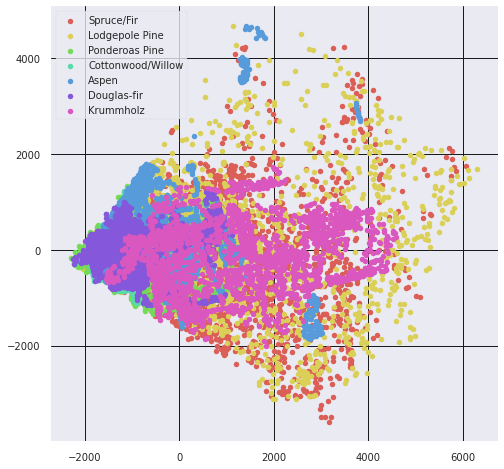

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_result = pca.fit_transform(train_updated.loc[:,location_vars])
print("Total explained variance ratio (based on 2 components) = {:.2f}".format(pca.explained_variance_ratio_.sum()))

pca_df = pd.DataFrame(pca_result,columns=['PCA1','PCA2'])
pca_df = pd.concat([pca_df,train_updated['Cover_Type']],axis=1)

fashion_scatter(pca_df.loc[:,['PCA1','PCA2']].values, pca_df['Cover_Type'])

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* a

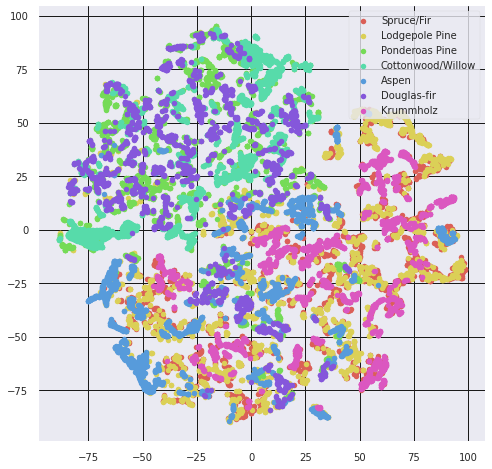

In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(random_state=234).fit_transform(train_updated.loc[:,location_vars])
fashion_scatter(tsne, pca_df['Cover_Type'])


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


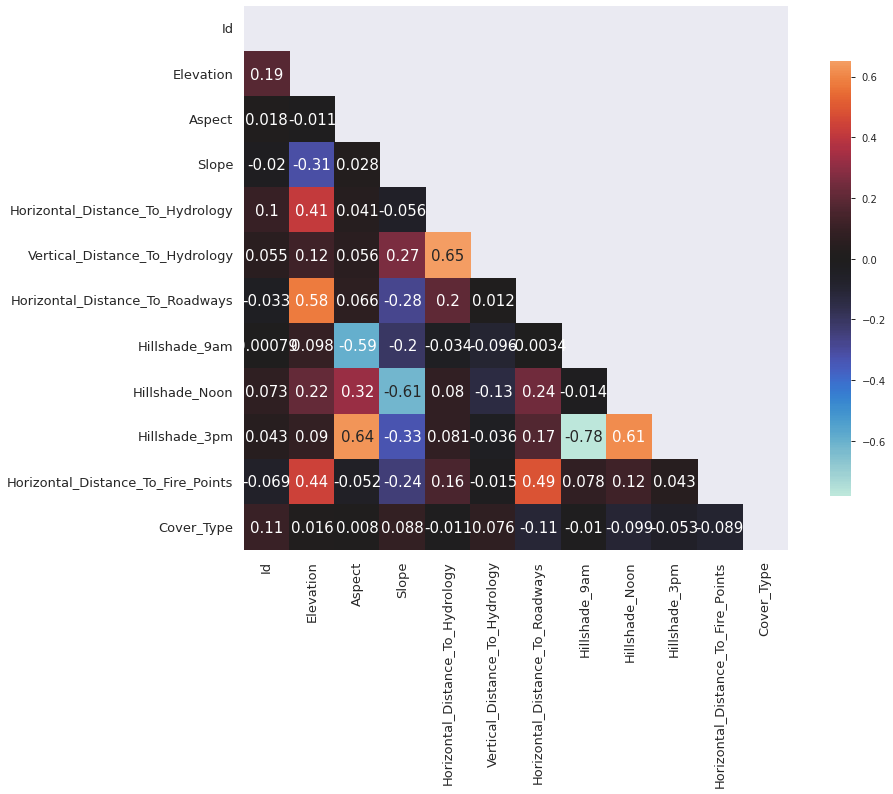

In [ ]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(15,10))

# compute correlation matrix
num_features_corr = train_numerical.corr()

# generate mask for upper triangle
mask = np.zeros_like(num_features_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# generate heatmap masking the upper triangle and shrink the cbar
sns.heatmap(num_features_corr, mask=mask, center=0, square=True, annot=True, annot_kws={"size": 15}, cbar_kws={"shrink": .8})
plt.xticks(size=13)
plt.yticks(size=13)

plt.show()

In [ ]:
from IPython.display import Image

def plota(a1,a2):
    fig = plt.figure(figsize=(16,8))
    sel = np.array(list(train.Cover_Type.values))
    plt.scatter(a1, a2, c=sel, s=100)
    plt.xlabel(a1.name)
    plt.ylabel(a2.name)


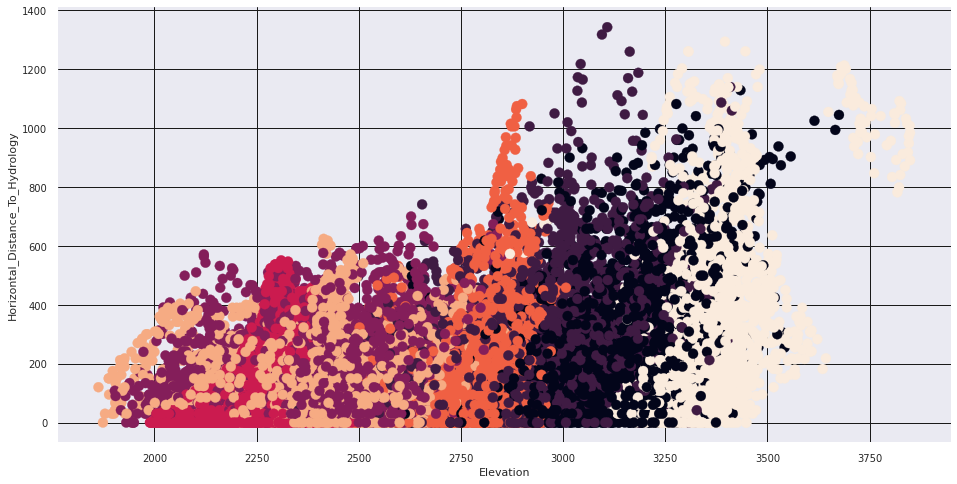

In [ ]:
plota(train.Elevation, train.Horizontal_Distance_To_Hydrology)


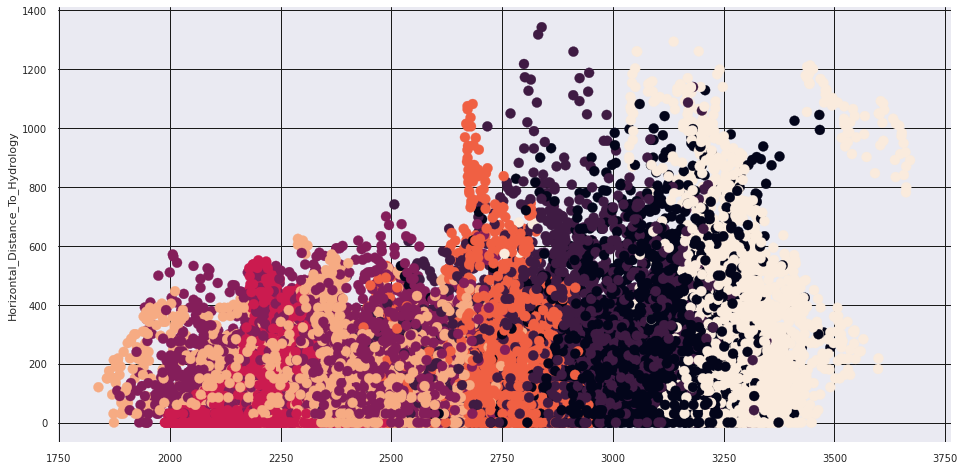

In [ ]:
plota(train.Elevation - 0.2 * train.Horizontal_Distance_To_Hydrology, train.Horizontal_Distance_To_Hydrology)



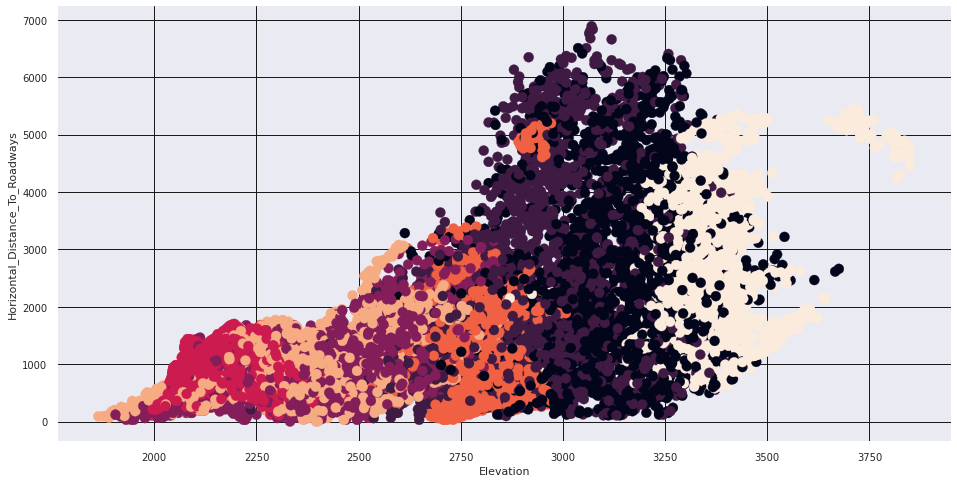

In [ ]:
plota(train.Elevation, train.Horizontal_Distance_To_Roadways)


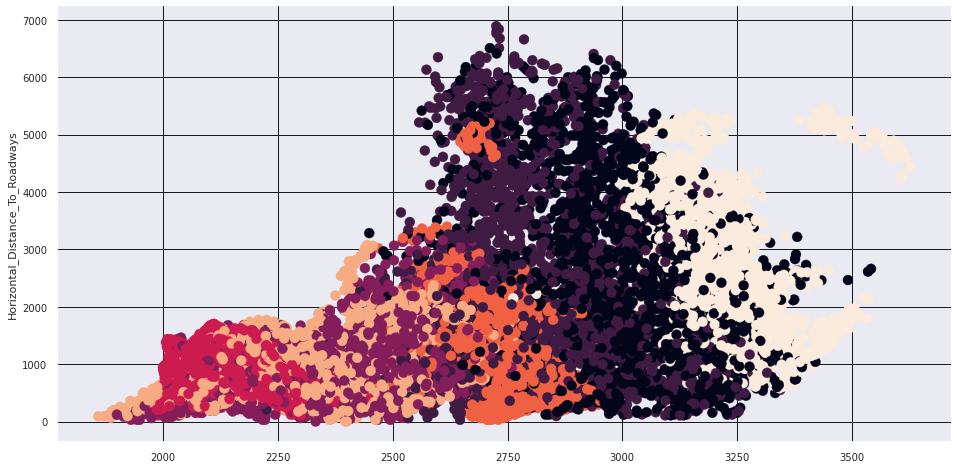

In [ ]:
plota(train.Elevation - .05 * train.Horizontal_Distance_To_Roadways, train.Horizontal_Distance_To_Roadways)


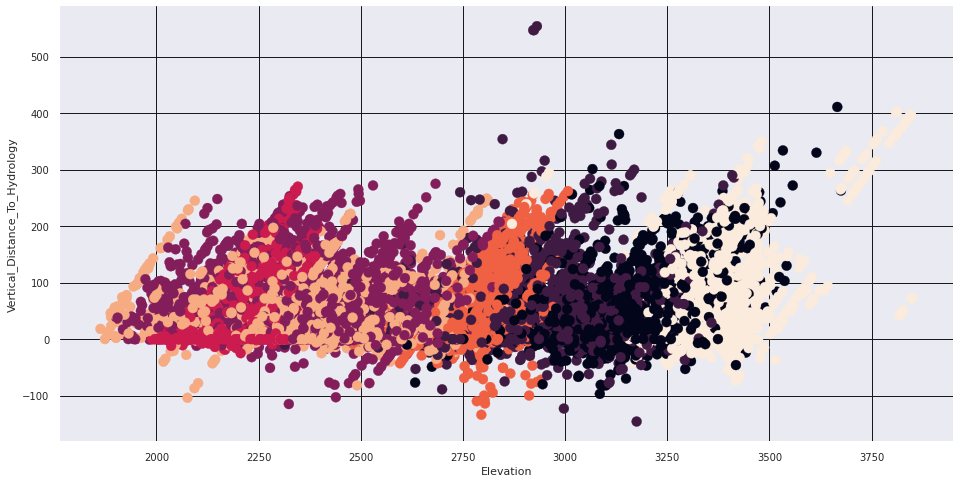

In [ ]:
plota(train.Elevation, train.Vertical_Distance_To_Hydrology)


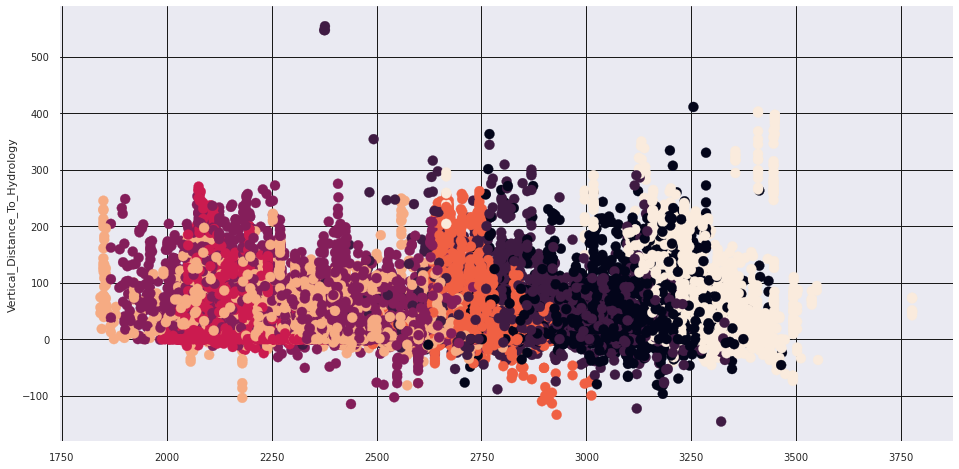

In [ ]:
plota(train.Elevation - train.Vertical_Distance_To_Hydrology, train.Vertical_Distance_To_Hydrology)


In [ ]:
train = train.iloc[:,1:]
train['Elev_to_Horizontal_Hyd']=train.Elevation - 0.2 * train.Horizontal_Distance_To_Hydrology 
train['Elev_to_Horizontal_Road']=train.Elevation - 0.05 * train.Horizontal_Distance_To_Roadways  
train['Elev_to_Verticle_Hyd']=train.Elevation - train.Vertical_Distance_To_Hydrology 

train['Mean_Horizontal_Dist']=(train.Horizontal_Distance_To_Fire_Points + train.Horizontal_Distance_To_Hydrology + 
                                 train.Horizontal_Distance_To_Roadways)/3 
train['Mean_Fire_Hydro']=(train.Horizontal_Distance_To_Fire_Points + train.Horizontal_Distance_To_Hydrology)/2


In [ ]:
!pip install optuna
import numpy as np, pandas as pd, matplotlib.pyplot as plt
import joblib
import optuna
import sklearn 

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import VotingClassifier

In [ ]:
X_train

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type,Cover_Type_Name,Elev_to_Horizontal_Hyd,Elev_to_Horizontal_Road,Elev_to_Verticle_Hyd,Mean_Horizontal_Dist,Mean_Fire_Hydro
0,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,5,Aspen,2544.4,2570.50,2596,2349.000000,3268.5
1,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,5,Aspen,2547.6,2570.50,2596,2275.666667,3218.5
2,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,2,Lodgepole Pine,2750.4,2645.00,2739,3189.666667,3194.5
3,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,2,Lodgepole Pine,2736.6,2630.50,2667,3181.000000,3226.5
4,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,5,Aspen,2564.4,2575.45,2596,2238.666667,3162.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,2607,243,23,258,7,660,170,251,214,1282,...,0,0,0,3,Ponderoas Pine,2555.4,2574.00,2600,733.333333,770.0
15116,2603,121,19,633,195,618,249,221,91,1325,...,0,0,0,3,Ponderoas Pine,2476.4,2572.10,2408,858.666667,979.0
15117,2492,134,25,365,117,335,250,220,83,1187,...,0,0,0,3,Ponderoas Pine,2419.0,2475.25,2375,629.000000,776.0
15118,2487,167,28,218,101,242,229,237,119,932,...,0,0,0,3,Ponderoas Pine,2443.4,2474.90,2386,464.000000,575.0


In [ ]:
first_column = train.pop('Cover_Type')
  
# insert column using insert(position,column_name,first_column) function
train.insert(0, 'Cover_Type', first_column)
  
# view
train.head()


,Cover_Type,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type_Name,Elev_to_Horizontal_Hyd,Elev_to_Horizontal_Road,Elev_to_Verticle_Hyd,Mean_Horizontal_Dist,Mean_Fire_Hydro
0,5,2596,51,3,258,0,510,221,232,148,...,0,0,0,0,Aspen,2544.4,2570.50,2596,2349.000000,3268.5
1,5,2590,56,2,212,-6,390,220,235,151,...,0,0,0,0,Aspen,2547.6,2570.50,2596,2275.666667,3218.5
2,2,2804,139,9,268,65,3180,234,238,135,...,0,0,0,0,Lodgepole Pine,2750.4,2645.00,2739,3189.666667,3194.5
3,2,2785,155,18,242,118,3090,238,238,122,...,0,0,0,0,Lodgepole Pine,2736.6,2630.50,2667,3181.000000,3226.5
4,5,2595,45,2,153,-1,391,220,234,150,...,0,0,0,0,Aspen,2564.4,2575.45,2596,2238.666667,3162.5


In [ ]:
train

,Cover_Type,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type_Name,Elev_to_Horizontal_Hyd,Elev_to_Horizontal_Road,Elev_to_Verticle_Hyd,Mean_Horizontal_Dist,Mean_Fire_Hydro
0,5,2596,51,3,258,0,510,221,232,148,...,0,0,0,0,Aspen,2544.4,2570.50,2596,2349.000000,3268.5
1,5,2590,56,2,212,-6,390,220,235,151,...,0,0,0,0,Aspen,2547.6,2570.50,2596,2275.666667,3218.5
2,2,2804,139,9,268,65,3180,234,238,135,...,0,0,0,0,Lodgepole Pine,2750.4,2645.00,2739,3189.666667,3194.5
3,2,2785,155,18,242,118,3090,238,238,122,...,0,0,0,0,Lodgepole Pine,2736.6,2630.50,2667,3181.000000,3226.5
4,5,2595,45,2,153,-1,391,220,234,150,...,0,0,0,0,Aspen,2564.4,2575.45,2596,2238.666667,3162.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,3,2607,243,23,258,7,660,170,251,214,...,0,0,0,0,Ponderoas Pine,2555.4,2574.00,2600,733.333333,770.0
15116,3,2603,121,19,633,195,618,249,221,91,...,0,0,0,0,Ponderoas Pine,2476.4,2572.10,2408,858.666667,979.0
15117,3,2492,134,25,365,117,335,250,220,83,...,0,0,0,0,Ponderoas Pine,2419.0,2475.25,2375,629.000000,776.0
15118,3,2487,167,28,218,101,242,229,237,119,...,0,0,0,0,Ponderoas Pine,2443.4,2474.90,2386,464.000000,575.0


In [ ]:
del train['Cover_Type_Name']

In [ ]:
train

,Cover_Type,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Elev_to_Horizontal_Hyd,Elev_to_Horizontal_Road,Elev_to_Verticle_Hyd,Mean_Horizontal_Dist,Mean_Fire_Hydro
0,5,2596,51,3,258,0,510,221,232,148,...,0,0,0,0,0,2544.4,2570.50,2596,2349.000000,3268.5
1,5,2590,56,2,212,-6,390,220,235,151,...,0,0,0,0,0,2547.6,2570.50,2596,2275.666667,3218.5
2,2,2804,139,9,268,65,3180,234,238,135,...,0,0,0,0,0,2750.4,2645.00,2739,3189.666667,3194.5
3,2,2785,155,18,242,118,3090,238,238,122,...,0,0,0,0,0,2736.6,2630.50,2667,3181.000000,3226.5
4,5,2595,45,2,153,-1,391,220,234,150,...,0,0,0,0,0,2564.4,2575.45,2596,2238.666667,3162.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,3,2607,243,23,258,7,660,170,251,214,...,0,0,0,0,0,2555.4,2574.00,2600,733.333333,770.0
15116,3,2603,121,19,633,195,618,249,221,91,...,0,0,0,0,0,2476.4,2572.10,2408,858.666667,979.0
15117,3,2492,134,25,365,117,335,250,220,83,...,0,0,0,0,0,2419.0,2475.25,2375,629.000000,776.0
15118,3,2487,167,28,218,101,242,229,237,119,...,0,0,0,0,0,2443.4,2474.90,2386,464.000000,575.0


In [ ]:
X_cat = train.iloc[:, 11:55].values   #categorical variables
B = train.iloc[:, 55:60]  # extra created variables
A = train.iloc[:, 1:11] # numerical variables
X_num = pd.concat([A, B], axis = 1).values
y = train.iloc[:, 0].values  #target variable


In [ ]:
scaler = StandardScaler()
# fit to training data
scaler.fit(X_num)
# scale num columns
X_num = scaler.transform(X_num)

# shape
print(f'Categorical Shape: {X_cat.shape}')
print(f'Numerical Shape: {X_num.shape}')
print(f'Label Shape: {y.shape}')


Categorical Shape: (15120, 44)
Numerical Shape: (15120, 15)
Label Shape: (15120,)


In [ ]:
X = np.hstack((X_num, X_cat))
print(X.shape)


(15120, 59)


Text(0.5, 1.0, 'PCA Number of Components for Cumulative Variance')

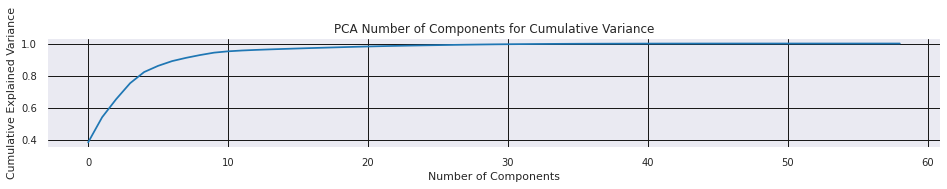

In [ ]:
pca = PCA().fit(X)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Number of Components for Cumulative Variance')

In [ ]:
pca = PCA(n_components = 10)
pca.fit(X)


PCA(n_components=10)

In [ ]:
print(pca.components_)

# print variances
print(pca.explained_variance_)


[[ 3.67381366e-01  6.48011123e-03 -1.72557404e-01  1.69532507e-01
   3.58311028e-02  2.89989148e-01  3.52355142e-02  1.32550715e-01
   7.03404149e-02  2.75029685e-01  3.63843075e-01  3.50326828e-01
   3.64746062e-01  3.36293883e-01  2.93484097e-01  6.96012643e-02
   1.21449009e-02  5.71420514e-02 -1.38888217e-01 -1.25546806e-02
  -9.65928325e-03 -2.94122676e-02 -9.96684080e-03 -5.68364626e-03
  -1.37846004e-02  0.00000000e+00  4.54505940e-05 -1.10209039e-04
  -5.15725586e-02 -1.90922332e-03  4.74502465e-03  5.57192689e-04
  -5.40853308e-03  0.00000000e+00 -1.24595498e-03 -1.20495364e-02
   9.81126059e-04  8.14759411e-04  1.56442667e-03  2.28584315e-04
   7.82317757e-03  1.41535920e-02  4.11935188e-03  2.71481491e-05
   9.13818155e-04  4.95423787e-04 -2.30240423e-05  2.65219679e-02
   9.16380041e-04  4.21596687e-03  1.22205015e-02  7.86182307e-03
   3.82776229e-04  2.93701152e-03  3.67005730e-04  1.16873593e-03
   2.45379116e-02  1.73488510e-02  1.84323512e-02]
 [ 4.77286397e-02 -4.9257

In [ ]:
lr_model = LogisticRegression(random_state = 1, 
                              penalty = 'none', 
                              max_iter = 500, 
                              solver = 'saga')
lr_model.fit(X, y)
print(lr_model.score(X, y))


0.7126322751322751


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,


In [ ]:
%%time

# optuna hyperparameter tuning
def objective(trial):
    max_depth = trial.suggest_int('max_depth', 2, 50)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 32)
    dt_clf = DecisionTreeClassifier(random_state = 1, max_depth = max_depth, min_samples_leaf = min_samples_leaf)
    return sklearn.model_selection.cross_val_score(dt_clf, X, y, n_jobs = -1, cv = 10).mean()
    
dt_study = optuna.create_study(direction='maximize')
dt_study.optimize(objective, n_trials=100)
dt = dt_study.best_trial
print('Accuracy: {}'.format(dt.value))
print("Best hyperparameters: {}".format(dt.params))

[I 2022-04-02 18:41:08,948] A new study created in memory with name: no-name-3167176e-31ca-43aa-8761-dfbf393b5bd9
[I 2022-04-02 18:41:14,175] Trial 0 finished with value: 0.7027116402116402 and parameters: {'max_depth': 22, 'min_samples_leaf': 2}. Best is trial 0 with value: 0.7027116402116402.
[I 2022-04-02 18:41:17,332] Trial 1 finished with value: 0.7145502645502646 and parameters: {'max_depth': 21, 'min_samples_leaf': 1}. Best is trial 1 with value: 0.7145502645502646.
[I 2022-04-02 18:41:20,128] Trial 2 finished with value: 0.6970238095238096 and parameters: {'max_depth': 18, 'min_samples_leaf': 8}. Best is trial 1 with value: 0.7145502645502646.
[I 2022-04-02 18:41:22,192] Trial 3 finished with value: 0.6913359788359789 and parameters: {'max_depth': 39, 'min_samples_leaf': 6}. Best is trial 1 with value: 0.7145502645502646.
[I 2022-04-02 18:41:24,223] Trial 4 finished with value: 0.694047619047619 and parameters: {'max_depth': 48, 'min_samples_leaf': 4}. Best is trial 1 with valu

Accuracy: 0.7187169312169313
Best hyperparameters: {'max_depth': 19, 'min_samples_leaf': 1}
CPU times: user 6.34 s, sys: 795 ms, total: 7.14 s
Wall time: 3min 18s


In [ ]:
dt_model = DecisionTreeClassifier(random_state = 1, 
                                  max_depth = dt_study.best_trial.params['max_depth'], 
                                  min_samples_leaf = dt_study.best_trial.params['min_samples_leaf'])
dt_model.fit(X, y)


DecisionTreeClassifier(max_depth=19, random_state=1)

In [ ]:
%%time

# optuna hyperparameter tuning
def objective(trial):
    n_estimators = trial.suggest_int('n_estimators', 100, 150)
    max_depth = trial.suggest_int('max_depth', 20, 50)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    rf_clf = RandomForestClassifier(random_state = 1, n_estimators = n_estimators, max_depth = max_depth, min_samples_leaf = min_samples_leaf)
    return sklearn.model_selection.cross_val_score(rf_clf, X, y, n_jobs = -1, cv = 10).mean()
    
rf_study = optuna.create_study(direction='maximize')
rf_study.optimize(objective, n_trials=20)
rf = rf_study.best_trial
print('Accuracy: {}'.format(rf.value))
print("Best hyperparameters: {}".format(rf.params))


[I 2022-04-02 18:49:01,323] A new study created in memory with name: no-name-478024f6-4cc9-426b-9b83-58661589ee90
[I 2022-04-02 18:49:25,787] Trial 0 finished with value: 0.7339285714285715 and parameters: {'n_estimators': 125, 'max_depth': 44, 'min_samples_leaf': 17}. Best is trial 0 with value: 0.7339285714285715.
[I 2022-04-02 18:49:41,521] Trial 1 finished with value: 0.7308201058201058 and parameters: {'n_estimators': 106, 'max_depth': 50, 'min_samples_leaf': 20}. Best is trial 0 with value: 0.7339285714285715.
[I 2022-04-02 18:50:04,147] Trial 2 finished with value: 0.743915343915344 and parameters: {'n_estimators': 136, 'max_depth': 23, 'min_samples_leaf': 13}. Best is trial 2 with value: 0.743915343915344.
[I 2022-04-02 18:50:23,739] Trial 3 finished with value: 0.7342592592592593 and parameters: {'n_estimators': 131, 'max_depth': 27, 'min_samples_leaf': 18}. Best is trial 2 with value: 0.743915343915344.
[I 2022-04-02 18:50:44,067] Trial 4 finished with value: 0.73849206349206

Accuracy: 0.7992724867724867
Best hyperparameters: {'n_estimators': 116, 'max_depth': 38, 'min_samples_leaf': 1}
CPU times: user 3.57 s, sys: 423 ms, total: 3.99 s
Wall time: 7min 22s


In [ ]:
rf_model = RandomForestClassifier(random_state = 1, 
                                  n_estimators = rf_study.best_trial.params['n_estimators'], 
                                  max_depth = rf_study.best_trial.params['max_depth'], 
                                  min_samples_leaf = rf_study.best_trial.params['min_samples_leaf'])

rf_model.fit(X, y)


RandomForestClassifier(max_depth=38, n_estimators=116, random_state=1)

In [ ]:
%%time

# optuna hyperparameter tuning
def objective(trial):
    max_depth = trial.suggest_int('max_depth', 30, 50)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    tree_clf = ExtraTreesClassifier(random_state = 0, n_estimators = 200, max_depth = max_depth, min_samples_leaf = min_samples_leaf)
    return sklearn.model_selection.cross_val_score(tree_clf, X, y, n_jobs = -1, cv = 10).mean()
    
tree_study = optuna.create_study(direction='maximize')
tree_study.optimize(objective, n_trials=20)
tree = tree_study.best_trial
print('Accuracy: {}'.format(tree.value))
print("Best hyperparameters: {}".format(tree.params))


[I 2022-04-02 18:56:27,294] A new study created in memory with name: no-name-431404c4-ba1f-4df6-86b3-fd32a4d4fdbb
[I 2022-04-02 18:56:44,862] Trial 0 finished with value: 0.7253306878306878 and parameters: {'max_depth': 42, 'min_samples_leaf': 8}. Best is trial 0 with value: 0.7253306878306878.
[I 2022-04-02 18:57:01,793] Trial 1 finished with value: 0.7239417989417989 and parameters: {'max_depth': 41, 'min_samples_leaf': 9}. Best is trial 0 with value: 0.7253306878306878.
[I 2022-04-02 18:57:17,603] Trial 2 finished with value: 0.7009920634920636 and parameters: {'max_depth': 32, 'min_samples_leaf': 18}. Best is trial 0 with value: 0.7253306878306878.
[I 2022-04-02 18:57:35,093] Trial 3 finished with value: 0.7296957671957672 and parameters: {'max_depth': 44, 'min_samples_leaf': 7}. Best is trial 3 with value: 0.7296957671957672.
[I 2022-04-02 18:57:50,875] Trial 4 finished with value: 0.7083994708994709 and parameters: {'max_depth': 49, 'min_samples_leaf': 15}. Best is trial 3 with v

Accuracy: 0.8095238095238095
Best hyperparameters: {'max_depth': 31, 'min_samples_leaf': 1}
CPU times: user 3.46 s, sys: 425 ms, total: 3.89 s
Wall time: 6min 40s


In [ ]:
rf_model = RandomForestClassifier(random_state = 1, 
                                  n_estimators = 130, 
                                  max_depth = 50, 
                                  min_samples_leaf = 1)

rf_model.fit(X, y)


RandomForestClassifier(max_depth=50, n_estimators=130, random_state=1)

In [ ]:
tree_model = ExtraTreesClassifier(random_state = 1, 
                                  n_estimators = 1000, 
                                  max_depth = 33, 
                                  min_samples_leaf = 1)

tree_model.fit(X, y)


ExtraTreesClassifier(max_depth=33, n_estimators=1000, random_state=1)

In [ ]:
%%time
# best model
gradb_model = GradientBoostingClassifier(random_state = 0,
                                         max_depth = 19, 
                                         min_samples_leaf = 16)

gradb_model.fit(X, y)


CPU times: user 3min 57s, sys: 240 ms, total: 3min 57s
Wall time: 3min 56s


In [ ]:
%%time
# best model
lgbm_model = LGBMClassifier(random_state = 0,
                            max_depth = 16,
                            num_leaves = 10)

lgbm_model.fit(X, y)


CPU times: user 1.82 s, sys: 20.8 ms, total: 1.84 s
Wall time: 1.85 s


In [ ]:
%%time 
# create ensemble classifier 
ensemble_model = VotingClassifier(
    estimators = [('tree', tree_model), 
                  ('rf', rf_model), 
                  ('gradb', gradb_model)], 
                  # ('xgb', xgb_model)],
    voting = 'hard'
)

# fit
ensemble_model.fit(X, y)

# print training accuracy
print('Logistic Regression Accuracy', lr_model.score(X, y))
print('Decision Tree Accuracy', dt_model.score(X, y))
print('Random Forest Accuracy', rf_model.score(X, y))
print('Extra Trees Accuracy', tree_model.score(X, y))
print('Gradient Boosting Accuracy', gradb_model.score(X, y))
#print('Extra Gradient Boosting Accuracy', xgb_model.score(X, y))
print('LightGBM Accuracy', lgbm_model.score(X, y))
print('Ensemble Accuracy:', ensemble_model.score(X, y))


Logistic Regression Accuracy 0.7126322751322751
Decision Tree Accuracy 0.9808201058201058
Random Forest Accuracy 1.0
Extra Trees Accuracy 1.0
Gradient Boosting Accuracy 1.0
LightGBM Accuracy 0.8533730158730158
Ensemble Accuracy: 1.0
CPU times: user 4min 33s, sys: 1.01 s, total: 4min 34s
Wall time: 4min 33s


In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: n {confusion_matrix(y_train, pred)}n")
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: n {confusion_matrix(y_test, pred)}n")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
from sklearn.svm import LinearSVC
model = LinearSVC(loss='hinge', dual=True)
model.fit(X_train, y_train)
print_score(model, X_train, y_train, X_test, y_test, train=True)
print_score(model, X_train, y_train, X_test, y_test, train=False)



Train Result:n================================================
Accuracy Score: 62.90%
_______________________________________________
CLASSIFICATION REPORT:n                     1            2            3            4            5  \
precision     0.566038     0.560494     0.467597     0.755827     0.611810   
recall        0.759740     0.151132     0.309571     0.908606     0.741060   
f1-score      0.648739     0.238070     0.372518     0.825204     0.670261   
support    1540.000000  1502.000000  1515.000000  1499.000000  1510.000000   

                     6            7  accuracy     macro avg  weighted avg  
precision     0.511940     0.872616  0.628968      0.620903      0.620533  
recall        0.681457     0.849469  0.628968      0.628719      0.628968  
f1-score      0.584659     0.860887  0.628968      0.600048      0.600069  
support    1510.000000  1508.000000  0.628968  10584.000000  10584.000000  
_______________________________________________
Confusion Matrix: n [[11

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


In [ ]:
from sklearn.svm import SVC
# The hyperparameter coef0 controls how much the model is influenced by high degree ploynomials
model = SVC(kernel='poly', degree=2, gamma='auto', coef0=1, C=5)
model.fit(X_train, y_train)
print_score(model, X_train, y_train, X_test, y_test, train=True)
print_score(model, X_train, y_train, X_test, y_test, train=False)


Train Result:n================================================
Accuracy Score: 76.38%
_______________________________________________
CLASSIFICATION REPORT:n                     1            2            3            4            5  \
precision     0.696636     0.704527     0.696140     0.833135     0.801602   
recall        0.739610     0.569907     0.654785     0.932622     0.861589   
f1-score      0.717480     0.630107     0.674830     0.880076     0.830514   
support    1540.000000  1502.000000  1515.000000  1499.000000  1510.000000   

                     6            7  accuracy     macro avg  weighted avg  
precision     0.682612     0.918549  0.763794      0.761886      0.761609  
recall        0.699338     0.889920  0.763794      0.763967      0.763794  
f1-score      0.690873     0.904008  0.763794      0.761127      0.760911  
support    1510.000000  1508.000000  0.763794  10584.000000  10584.000000  
_______________________________________________
Confusion Matrix: n [[11

In [ ]:
model = SVC(kernel='rbf', gamma=0.5, C=0.1)
model.fit(X_train, y_train)
print_score(model, X_train, y_train, X_test, y_test, train=True)
print_score(model, X_train, y_train, X_test, y_test, train=False)


Train Result:n================================================
Accuracy Score: 78.81%
_______________________________________________
CLASSIFICATION REPORT:n                     1            2            3            4            5  \
precision     0.603960     0.787715     0.722995     0.885880     0.899399   
recall        0.911039     0.580559     0.720132     0.916611     0.793377   
f1-score      0.726378     0.668455     0.721561     0.900984     0.843068   
support    1540.000000  1502.000000  1515.000000  1499.000000  1510.000000   

                     6            7  accuracy     macro avg  weighted avg  
precision     0.774265     0.962910  0.788076      0.805304      0.804594  
recall        0.697351     0.895225  0.788076      0.787756      0.788076  
f1-score      0.733798     0.927835  0.788076      0.788868      0.788608  
support    1510.000000  1508.000000  0.788076  10584.000000  10584.000000  
_______________________________________________
Confusion Matrix: n [[14

In [ ]:
# from sklearn.model_selection import GridSearchCV
# param_grid = {'C': [0.01, 0.1, 0.5, 1, 10, 100], 
#               'gamma': [1, 0.75, 0.5, 0.25, 0.1, 0.01, 0.001], 
#               'kernel': ['rbf', 'poly', 'linear']} 
# grid = GridSearchCV(SVC(), param_grid, refit=True, verbose=1, cv=5)
# grid.fit(X_train, y_train)
# best_params = grid.best_params_
# print(f"Best params: {best_params}")
# svm_clf = SVC(**best_params)
# svm_clf.fit(X_train, y_train)
# print_score(svm_clf, X_train, y_train, X_test, y_test, train=True)
# print_score(svm_clf, X_train, y_train, X_test, y_test, train=False)


In [ ]:
pca = PCA(n_components = 10)
pca.fit(X)
feature_scaled_pca = pca.transform(X)
print("shape of the scaled and 'PCA'ed features: ", np.shape(feature_scaled_pca))


shape of the scaled and 'PCA'ed features:  (15120, 10)


In [ ]:
feat_var = np.var(feature_scaled_pca, axis=0)
feat_var_rat = feat_var/(np.sum(feat_var))

print ("Variance Ratio of the 10 Principal Components Ananlysis: ", feat_var_rat)


Variance Ratio of the 10 Principal Components Ananlysis:  [0.40616599 0.16643856 0.11935995 0.10595492 0.07365349 0.04108688
 0.03142319 0.02161975 0.01843339 0.01586389]


In [ ]:
#taking top 4 PCAs
cover_target_list = train['Cover_Type'].tolist()
feature_scaled_pca_X0 = feature_scaled_pca[:, 0]
feature_scaled_pca_X1 = feature_scaled_pca[:, 1]
feature_scaled_pca_X2 = feature_scaled_pca[:, 2]
feature_scaled_pca_X3 = feature_scaled_pca[:, 3]




Text(0, 0.5, 'Second Principal Component')

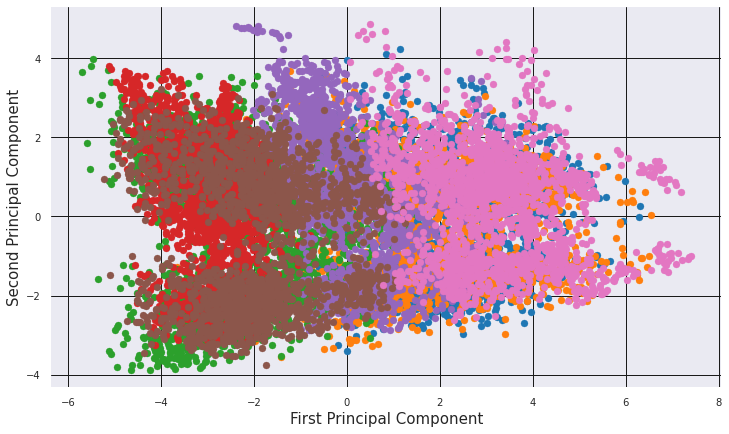

In [ ]:
#visualizing PCA1 and PCA2 
fig = plt.figure(figsize=(12, 7))
labels = cover_target_list
for l in np.unique(labels):
    ix = np.where(labels==l)
    plt.scatter(feature_scaled_pca_X0[ix], feature_scaled_pca_X1[ix])

plt.xlabel("First Principal Component", fontsize=15)
plt.ylabel("Second Principal Component", fontsize=15)

Text(0, 0.5, 'Fourth Principal Component')

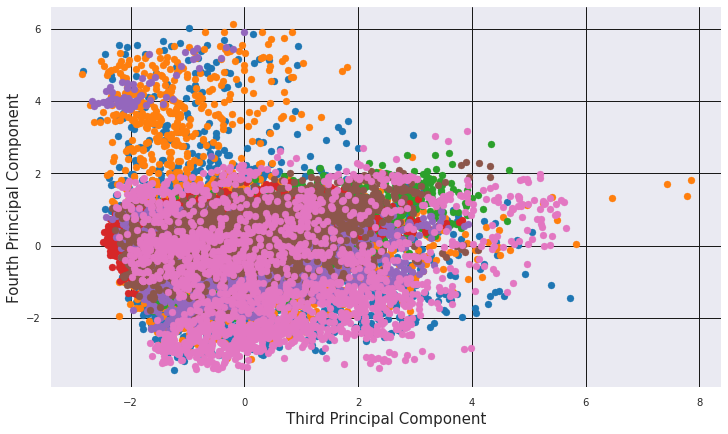

In [ ]:
#visualizing PCA3 and PCA4
fig = plt.figure(figsize=(12, 7))
labels = cover_target_list
for l in np.unique(labels):
    ix = np.where(labels==l)
    plt.scatter(feature_scaled_pca_X2[ix], feature_scaled_pca_X3[ix])

plt.xlabel("Third Principal Component", fontsize=15)
plt.ylabel("Fourth Principal Component", fontsize=15)

In [ ]:
from sklearn.pipeline import Pipeline
# Pipeline Steps are StandardScaler, PCA and SVM 
pipe_steps = [('scaler', StandardScaler()), ('pca', PCA()), ('SupVM', SVC(kernel='rbf'))]

check_params= {
    'pca__n_components': [10], 
    'SupVM__C': [0.1, 0.5, 1, 10,30, 40, 50, 75, 100, 500, 1000], 
    'SupVM__gamma' : [0.01, 0.05, 0.07, 0.1, 0.5, 1, 5, 10, 50]
}

pipeline = Pipeline(pipe_steps)


In [ ]:
# from tqdm import tqdm_notebook as tqdm 
# print ("Start Fitting Training Data")
# for cv in tqdm(range(4,6)):
#     create_grid = GridSearchCV(pipeline, param_grid=check_params, cv=cv)
#     create_grid.fit(X_train, y_train)
#     print ("score for %d fold CV := %3.2f" %(cv, create_grid.score(X_test, y_test)))
#     print ("!!!!!!!! Best-Fit Parameters From Training Data !!!!!!!!!!!!!!")
#     print (create_grid.best_params_)

# print ("out of the loop")


In [ ]:
scaler1 = StandardScaler()
scaler1.fit(X_test)
X_test_scaled = scaler1.transform(X_test)


pca3 = PCA(n_components=10)
X_test_scaled_reduced = pca3.fit_transform(X_test_scaled)


In [ ]:
svm_model = SVC(kernel='rbf', C=1., 
                gamma=.5)


classify = svm_model.fit(X_test_scaled_reduced, y_test)

print ('check shape of support vector array: ', (svm_model.support_vectors_[0]))


from mpl_toolkits import mplot3d
from matplotlib import animation


check shape of support vector array:  [ 3.58007781 -1.37847182]


In [ ]:
def plot_contours(ax1, clf, xx, yy, **params):
    """Plot the decision boundaries for a classifier.

    Parameters
    ----------
    ax: matplotlib axes object
    clf: a classifier
    xx: meshgrid ndarray
    yy: meshgrid ndarray
    params: dictionary of params to pass to contourf, optional
    """
    Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
    print ('initial decision function shape; ', np.shape(Z))
    Z = Z.reshape(xx.shape)
    print ('final decision function shape; ', np.shape(Z))
    out = ax1.contourf(xx, yy, Z, **params)
    return out

In [ ]:
def make_meshgrid(x, y, h=.2):
    """Create a mesh of points to plot in

    Parameters
    ----------
    x: data to base x-axis meshgrid on
    y: data to base y-axis meshgrid on
    h: stepsize for meshgrid, optional

    Returns
    -------
    xx, yy : ndarray
    """
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
#    z_min, z_max = z.min() - 1, z.max() + 1
    print ('check x_min, x_max ; ',  x_min, x_max)
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))#,
                         #np.arange(z_min, z_max, h))
    return xx, yy

In [ ]:
X0, X1 = X_test_scaled_reduced[:, 0], X_test_scaled_reduced[:, 1]
xx, yy = make_meshgrid(X0, X1)
xx.shape

check x_min, x_max ;  -6.99515747271874 8.195495632755069


(61, 76)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Requested projection is different from current axis projection, creating new axis with requested projection.
  This is separate from the ipykernel package so we can avoid doing imports until


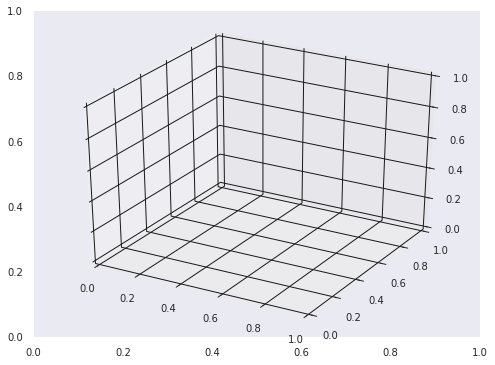

In [ ]:
fig, ax1 = plt.subplots(figsize=(8,6))
# ax1 = fig.add_subplot(111, projection='3d')
ax1 = fig.gca(projection='3d')
# ax1=Axes3D(fig)
# ax1.view_init(50, 40)
fig.patch.set_facecolor('white')
Y_tar_list = y_test.tolist()
yl1= [int(target1) for target1 in Y_tar_list]
labels1=yl1


In [ ]:
def plot3DBound():
    for l1 in np.unique(labels1):
        ix1=np.where(labels1==l1)
        ax1.scatter(X0[ix1],X1[ix1])

    ax1.scatter(svm_model.support_vectors_[:, 0], svm_model.support_vectors_[:, 1], s=40, 
              edgecolors='navy', label='Support Vectors')    

    plot_contours(ax1, classify, xx, yy,cmap='seismic', alpha=0.4)
    plt.xlabel("1st Principal Component",fontsize=14)
    plt.ylabel("2nd Principal Component",fontsize=14)
    plt.legend(fontsize=15)
    return fig

In [ ]:
#Validation Set
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size = .20, random_state = 1)
print(X_train.shape)
print(X_valid.shape)
print(y_train.shape)
print(y_valid.shape)
tree_model.fit(X_train, y_train)

(12096, 59)
(3024, 59)
(12096,)
(3024,)


ExtraTreesClassifier(max_depth=33, n_estimators=1000, random_state=1)

In [ ]:
# score for training set
train_acc = tree_model.score(X_train, y_train)
# score for validation set
valid_acc = tree_model.score(X_valid, y_valid)

print('Training Accuracy for Final Model', {round(train_acc, 4)})
print('Validation Accuracy for Final Model', {round(valid_acc, 4)})

Training Accuracy for Final Model {1.0}
Validation Accuracy for Final Model {0.8932}


In [ ]:
# predictions
valid_pred = tree_model.predict(X_valid)
# prob predictions
valid_proba = tree_model.predict_proba(X_valid)

In [ ]:
def top_k_accuracy(y_true, pred_prob, K):
    count = 0
    for i in range(len(y_true)):
        p = pred_prob[i, :]          # Get predictions for current observation
        rank = np.argsort(p) + 1     # Rank classes in increasing order; add 1 to get from 0-6 to 1-7 for label
        correct = y_true[i]          # Get correct class.
        if correct in rank[-K:]:     # See if correct class is in top k
            count += 1               # Increment count if so.

    return count / len(y_true)       # Return score

In [ ]:
# calculate accuracy for top 2 predictions
top_2_accuracy = top_k_accuracy(y_valid, valid_proba, 2)
print(round(top_2_accuracy, 4))

0.9798


In [ ]:
# classification report
c_report = classification_report(y_valid, valid_pred)
print(c_report)

              precision    recall  f1-score   support

           1       0.81      0.78      0.80       434
           2       0.83      0.74      0.78       458
           3       0.91      0.90      0.90       437
           4       0.96      0.98      0.97       447
           5       0.90      0.96      0.93       418
           6       0.90      0.94      0.92       411
           7       0.92      0.97      0.95       419

    accuracy                           0.89      3024
   macro avg       0.89      0.90      0.89      3024
weighted avg       0.89      0.89      0.89      3024



In [ ]:
# confusion matrix
cm = confusion_matrix(y_valid, valid_pred)
cm_df = pd.DataFrame(cm)
# Change the column names
cm_df.columns =[1, 2, 3, 4, 5, 6, 7]
cm_df.index = [1, 2, 3, 4, 5, 6, 7]
# display
cm_df

,1,2,3,4,5,6,7
1,340,57,0,0,5,0,32
2,68,338,10,0,33,8,1
3,0,1,392,13,4,27,0
4,0,0,5,440,0,2,0
5,0,6,7,0,401,4,0
6,0,3,16,5,2,385,0
7,12,2,0,0,0,0,405


In [ ]:
# validation predictions data frame
df_prob = pd.DataFrame(valid_proba)
df_prob.columns = [1, 2, 3, 4, 5, 6, 7]
df_prob

,1,2,3,4,5,6,7
0,0.000000,0.016106,0.068118,0.0,0.000000,0.915776,0.000000
1,0.371000,0.425000,0.000000,0.0,0.202000,0.002000,0.000000
2,0.001083,0.002000,0.000000,0.0,0.000000,0.000000,0.996917
3,0.006087,0.276991,0.000054,0.0,0.716868,0.000000,0.000000
4,0.360165,0.559063,0.000000,0.0,0.080688,0.000000,0.000083
...,...,...,...,...,...,...,...
3019,0.011852,0.094562,0.001048,0.0,0.890405,0.002133,0.000000
3020,0.022944,0.071591,0.000000,0.0,0.905412,0.000053,0.000000
3021,0.838245,0.150612,0.000000,0.0,0.007143,0.001000,0.003000
3022,0.001000,0.000000,0.000000,0.0,0.000000,0.000000,0.999000


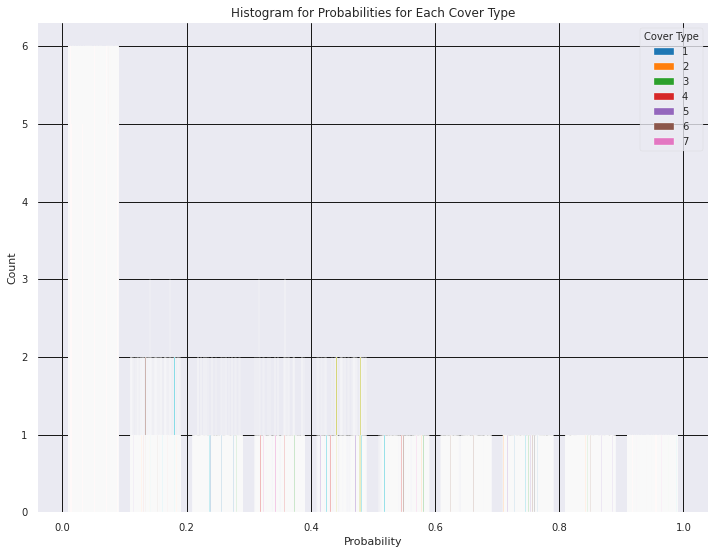

In [ ]:
# histogram chart for probabilities by cover type
plt.figure(figsize = [12,9])
plt.hist(df_prob)
plt.title('Histogram for Probabilities for Each Cover Type')
plt.ylabel('Count')
plt.xlabel('Probability')
plt.legend([1, 2, 3, 4, 5, 6, 7], title = 'Cover Type')
plt.show()

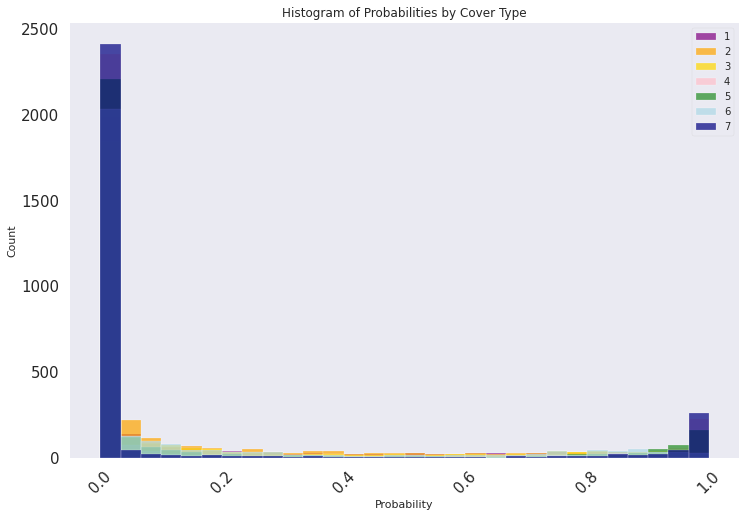

In [ ]:
df_prob.plot(kind = 'hist',
        alpha = 0.7,
        bins = 30,
        title = 'Histogram of Probabilities by Cover Type',
        rot = 45,
        grid = False,
        figsize = (12,8),
        fontsize = 15, 
        color = ['purple', 'orange', 'gold', 'pink', 'forestgreen', 'lightblue', 'navy'])
plt.xlabel('Probability')
plt.ylabel("Count");


<Figure size 1296x648 with 0 Axes>

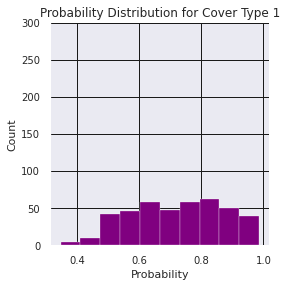

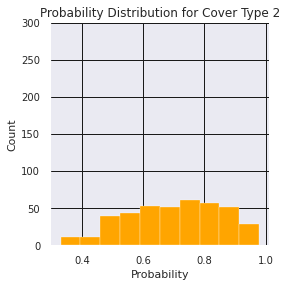

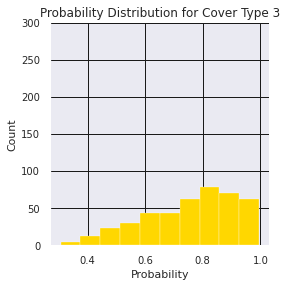

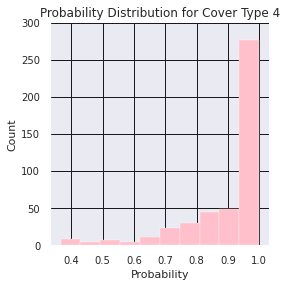

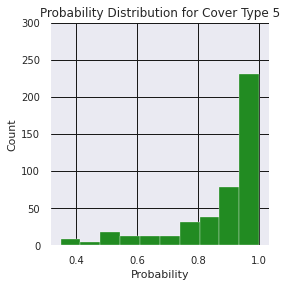

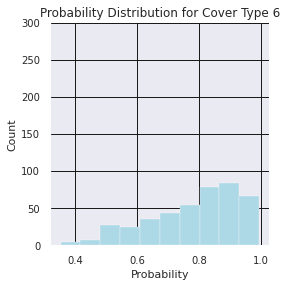

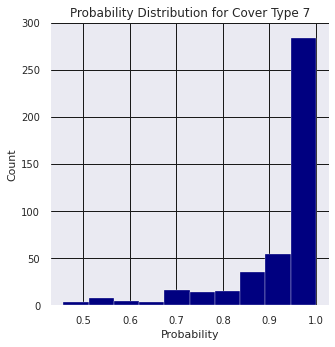

In [ ]:
maxValueIndex = df_prob.idxmax(axis=1)
maxValues = df_prob.max(axis=1)
pred_prob = pd.concat([maxValueIndex, maxValues], axis=1)
df_1 = pred_prob.loc[lambda x: x[0] == 1]
df_2 = pred_prob.loc[lambda x: x[0] == 2]
df_3 = pred_prob.loc[lambda x: x[0] == 3]
df_4 = pred_prob.loc[lambda x: x[0] == 4]
df_5 = pred_prob.loc[lambda x: x[0] == 5]
df_6 = pred_prob.loc[lambda x: x[0] == 6]
df_7 = pred_prob.loc[lambda x: x[0] == 7]
# histograms of probability estimates generated for each label
c_label = [1, 2, 3, 4, 5, 6, 7]
palette = ['purple', 'orange', 'gold', 'pink', 'forestgreen', 'lightblue', 'navy']
dflist = [df_1, df_2, df_3, df_4, df_5, df_6, df_7]
plt.figure(figsize = [18, 9])

for c in c_label:
    plt.figure(figsize = [18, 9])
    plt.subplot(2, 4, c)
    plt.hist(dflist[c-1][1], color = palette[c-1])
    plt.title(f'Probability Distribution for Cover Type {c_label[c-1]}')
    plt.ylabel('Count')
    plt.ylim(0, 300)
    plt.xlabel('Probability')
plt.tight_layout()
plt.show()